In [1]:
using ControlSystemsBase, LinearAlgebra, Plots, Statistics

First, we start by a simple LQR control design of the following linear system:

In [3]:
A = [-1 0.1; 0 -1];
B = [0; 1;;];
C = I;
D = 0;
sys = ss(A,B,C,D)
Ts = 1
sys_d = c2d(sys, Ts)
Q = 0.2I
R = I
W = diagm([0.2, 0.1])
K_LQR = -lqr(sys, Q, R)
K_d = -lqr(sys_d, Q, R)
display(K_LQR)
display(K_d)
display(K_d ./ K_LQR)

1×2 Matrix{Float64}:
 -0.00477072  -0.0958805

1×2 Matrix{Float64}:
 -0.00279388  -0.0490349

1×2 Matrix{Float64}:
 0.58563  0.511416

We can also achieve the same optimal controller using the controllability-type Gramian, i.e., via LMIs in an SDP (Problem~2 in the paper):

In [3]:
using JuMP
using MosekTools, SCS

In [4]:
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]
@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])
@objective(model, Min, tr(Q*Σ) + tr(R*Z₀))
@constraint(model, Σ-1e-5*I >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
@constraint(model, A*Σ + B*L + (A*Σ + B*L)' + W >= 0, PSDCone());
@constraint(model, A*Σ + B*L + (A*Σ + B*L)' + W <= 0, PSDCone());
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_LMI = L * inv(Σ) 

1×2 Matrix{Float64}:
 -0.0206794  -0.415603

In [5]:
norm(K_LMI - K_LQR, 2) # the two norm of the difference.

7.30039941454361e-5

In [208]:
"""
function f(x::Vector{Float64}, u::Vector{Float64})
    x⁺ = zero.(x);
    x⁺[1] = 0.9*x[1] + 0.1*x[2] + 0.0*x[1]*x[2]
    x⁺[2] = 0.97*x[2] + (1 + 0.0*x[2]^2) * u[1]
    return x⁺ + sqrt(W) * randn(size(x⁺))
end
"""

"function f(x::Vector{Float64}, u::Vector{Float64})\n    x⁺ = zero.(x);\n    x⁺[1] = 0.9*x[1] + 0.1*x[2] + 0.0*x[1]*x[2]\n    x⁺[2] = 0.97*x[2] + (1 + 0.0*x[2]^2) * u[1]\n    return x⁺ + sqrt(W) * randn(size(x⁺))\nend\n"

In [213]:
function f(x::Vector{Float64}, u::Vector{Float64})
    x⁺ = zero.(x);
    x⁺[1] = 1.0*x[1] + Ts*x[2]
    x⁺[2] = 1.0*x[2] + Ts * u[1]
    return x⁺ + sqrt(W) * randn(size(x⁺))
end

f (generic function with 1 method)

In [214]:
function f_dataGen_OL(x₀::Vector{Float64}, U::Matrix{Float64})
    N = size(U)[2]
    X = zeros(Float64, size(x₀)[1], N+1)
    X[:,1] = x₀
    for j=1:N
        X[:,j+1] = f(X[:,j], U[:,j])
    end
    return X[:,1:end-1]
end

f_dataGen (generic function with 1 method)

In [230]:
function f_dataGen_CL(x₀::Vector{Float64}, K::Matrix{Float64}, N::Int)
    X = zeros(Float64, size(K)[2], N+1)
    U = zeros(Float64, size(K)[1], N)
    X[:,1] = x₀
    for j=1:N
        U[:,j] = K * X[:,j] + sqrt(V) * randn(rᵤ,)
        X[:,j+1] = f(X[:,j], U[:,j])
    end
    return X[:,1:end-1], U
end

f_dataGen_CL (generic function with 1 method)

Now, suppose we have a nonlinear system of the following form:

2-element Vector{Float64}:
 0.4033520605161734
 0.9966479394838266

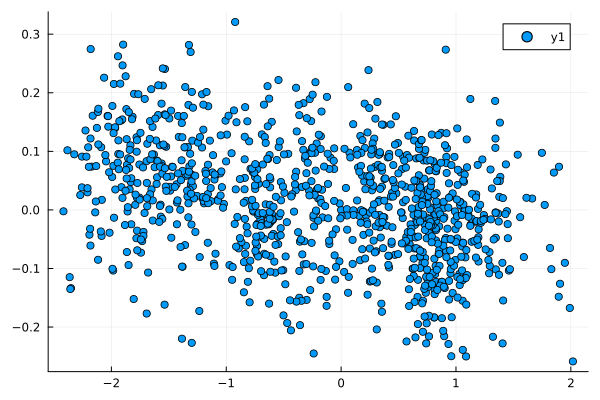

In [594]:
N = 1000
Ts = 0.1
Vc = [2;;]
V = Vc * Ts

x₀ = zeros(Float64, 2,)
K₀ = [-0.2  -6.0]
Wc = diagm([0.1, 0.05])
W = Wc * Ts

X, U = f_dataGen_CL(x₀, K₀, N)
display(abs.(eigen([1 Ts; 0 1] + [0; Ts] * K₀).values))
scatter(X[1,:], X[2,:])

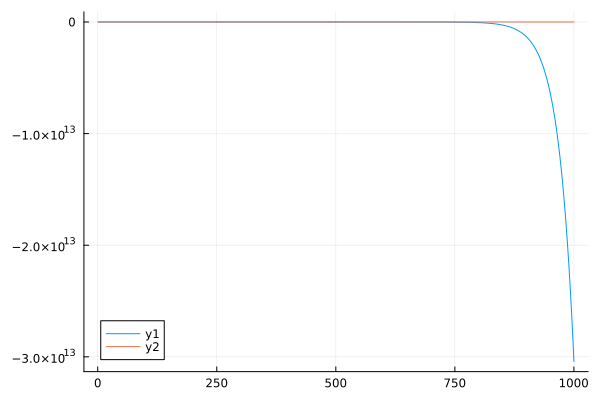

In [596]:
AB = X[:,2:end] / [X[:,1:end-1]; U[:,1:end-1]]
Ad = AB[:,1:rₓ]
Bd = AB[:,rₓ+1:end]
sys_d = ss(Ad,Bd,I,0,Ts)
sys_c= d2c(sys_d)
Ac = sys_c.A
Bc = sys_c.B
Q, R = I, 2I
K_CE = -lqr(sys_c,Q,R)
res = lsim(sys_d, U, x0 = x₀)
plot(res.y[1,:])
plot!(X[1,:])


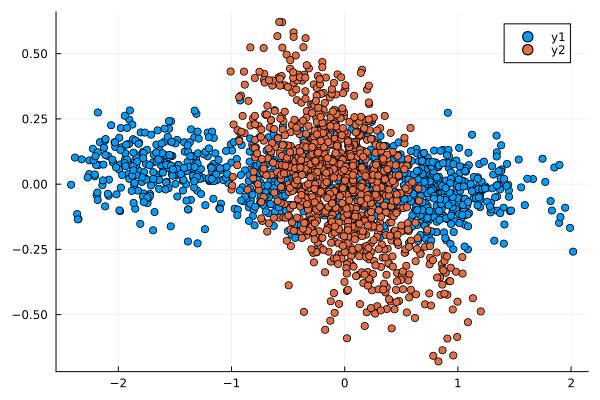

In [598]:
X_CE, _ = f_dataGen_CL(x₀, K_CE, N)
scatter(X[1,:], X[2,:])
scatter!(X_CE[1,:], X_CE[2,:])

1×2 Matrix{Float64}:
 -0.22098  -5.87146

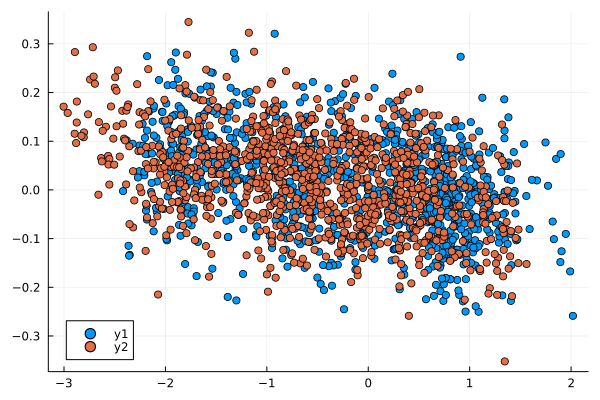

In [601]:
γ_F = 100000
Σ_data = 1/(N) * X * X'
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]

@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])

@objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

@constraint(model, Σ - (1e-6I) >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') >= 0, PSDCone());
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') <= 0, PSDCone());

@constraint(model, [(Σ - Ad*Σ*Ad' - Bd*L*Ad' - Ad*L'*Bd' - W - Bd*V*Bd') Bd*L; L'*Bd' Σ] >= 0, PSDCone());

@constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
#set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_prob6 = L * inv(Σ) 
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
scatter(X[1,:], X[2,:])
scatter!(X_prob6[1,:], X_prob6[2,:])

In [587]:
Z₀ - K_prob6 * Σ * K_prob6'

1×1 Matrix{Float64}:
 1.1087939547405057e-5

In [588]:
Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd')

2×2 Matrix{Float64}:
  6.37375e-9  -1.33386e-8
 -1.33386e-8  -1.63003e-8

1×2 Matrix{Float64}:
 -0.0919507  -2.65106

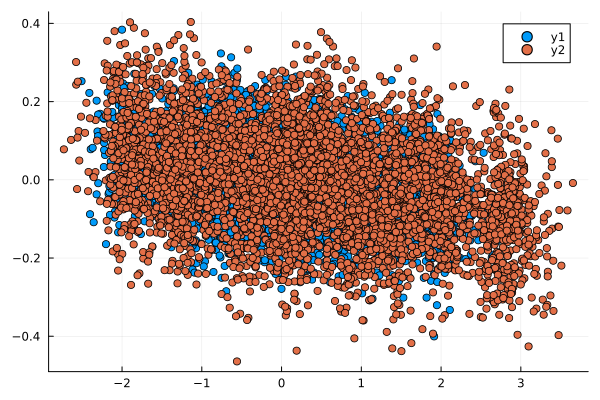

In [570]:
γ_F = 1000
Σ_data = 1/(N) * X * X'
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]

@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])

@objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

@constraint(model, Σ - (1e-6I) >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') >= 0, PSDCone());
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') <= 0, PSDCone());

@constraint(model, [(Σ - Ad*Σ*Ad' - Bd*L*Ad' - Ad*L'*Bd' - W - Bd*V*Bd') Bd*L; L'*Bd' Σ] >= 0, PSDCone());

@constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
#set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_prob6 = L * inv(Σ) 
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
scatter(X[1,:], X[2,:])
scatter!(X_prob6[1,:], X_prob6[2,:])

1×2 Matrix{Float64}:
 -0.0919507  -2.65106

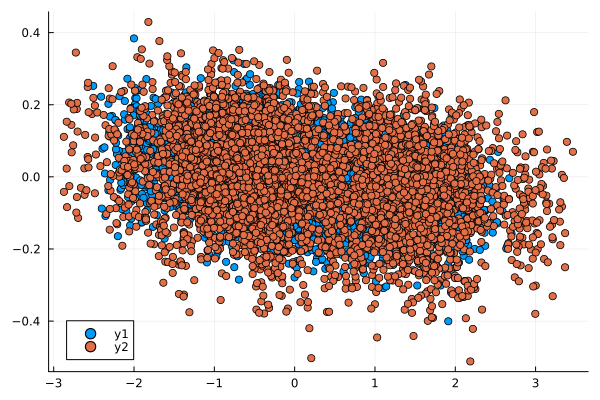

In [571]:
γ_F = 1000
Σ_data = 1/(N) * X * X'
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]

@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])

@objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

@constraint(model, Σ - (1e-6I) >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') >= 0, PSDCone());
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') <= 0, PSDCone());

@constraint(model, [(Σ - Ad*Σ*Ad' - Bd*L*Ad' - Ad*L'*Bd' - W - Bd*V*Bd') Bd*L; L'*Bd' Σ] >= 0, PSDCone());

@constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
#set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_prob6 = L * inv(Σ) 
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
scatter(X[1,:], X[2,:])
scatter!(X_prob6[1,:], X_prob6[2,:])

1×2 Matrix{Float64}:
 0.165305  -5.3863

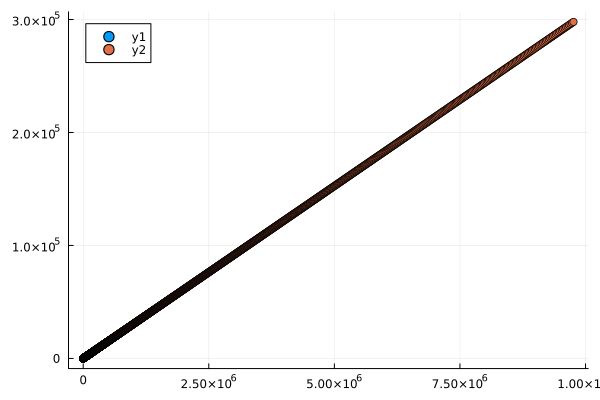

In [572]:
γ_F = 5000
Σ_data = 1/(N) * X * X'
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]

@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])

@objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

@constraint(model, Σ - (1e-6I) >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
@constraint(model, Ac*Σ + Bc*L + (Ac*Σ + Bc*L)' + W + Bc*V*Bc' >= 0, PSDCone());
@constraint(model, Ac*Σ + Bc*L + (Ac*Σ + Bc*L)' + W + Bc*V*Bc' <= 0, PSDCone());

@constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
#set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_prob6 = L * inv(Σ) 
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
scatter(X[1,:], X[2,:])
scatter!(X_prob6[1,:], X_prob6[2,:])

In [573]:
Z₀

1×1 Matrix{Float64}:
 0.5686158098661924

In [574]:
Z₀ - K_prob6 * Σ * K_prob6'

1×1 Matrix{Float64}:
 5.300449512635197e-8

In [575]:
Ac*Σ + Bc*L + (Ac*Σ + Bc*L)' + W + Bc*V*Bc'

2×2 Matrix{Float64}:
 -4.42364e-10  3.92056e-9
  3.92056e-9   1.83088e-9

In [589]:
Σ_data

2×2 Matrix{Float64}:
  0.997765   -0.0350536
 -0.0350536   0.00929078

In [590]:
Σ

2×2 Matrix{Float64}:
  0.997824   -0.0359268
 -0.0359268   0.00992886

In [534]:
norm(Σ - Σ_data)

0.054782507502622146